# E-commerce Data Analysis and Price Prediction

The Indian e-commerce business has been expanding rapidly. Following a boom in digital adoption at COVID-19, the Indian e-commerce sector is expected to be worth more than 55 billion dollars in Gross Merchandise Value by 2021. It is predicted to reach a gross merchandise value of 350 billion dollars by 2030. Furthermore, by 2021, over 348 million people were completing online transactions, with approximately 140 million purchasing online.
<br>This sector's primary drivers include a young demographic, increased internet and smartphone usage, and comparatively stronger economic performance. India is now the second largest internet market, with 830 million subscribers. With a 45.4% share in 2021, digital wallets were the biggest payment option for e-commerce purchases.
<br>Nearly all pin codes in India have witnessed e-commerce penetration. In India, tier two cities and smaller towns account for more than 60% of all transactions and orders. The e-commerce trend is gaining traction even in tier-2 and tier-3 cities, which now account for roughly half of all customers and three out of every five orders placed on big e-commerce platforms. Tier-2 and smaller towns have slightly lower average selling prices (ASP) than tier-1/metro cities. When measured by transaction value, electronics and clothes account for over 70% of the e-commerce market. Other emerging e-commerce sectors include ed-tech, hyperlocal, and food-tech; E-commerce financing in India increased by 600% year on year in 2021.

>The dataset was downloaded from kaggle (link given below) and we will be making an exploratory analysis of the data, visualise it and make prediction based on the data.
https://www.kaggle.com/competitions/sa2022/data
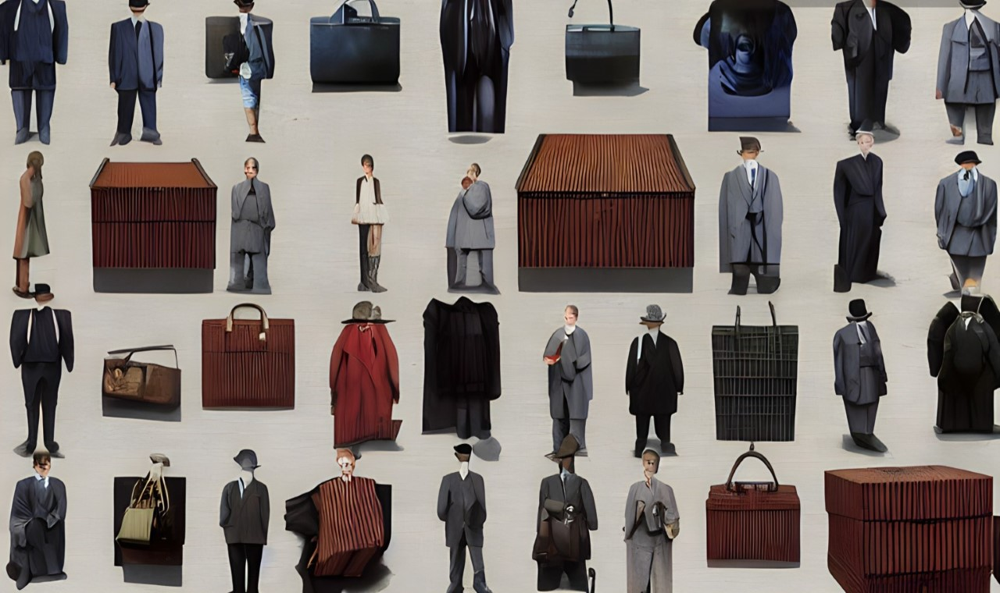

### Downloading the Dataset

The dataset used for this project can be download with the link given below.
https://www.kaggle.com/competitions/sa2022/data

Let's begin by downloading the data, and listing the files within the dataset.

In [1]:
dataset_url = 'https://www.kaggle.com/competitions/sa2022/data' 

In [2]:
import opendatasets as od
od.download(dataset_url)

Skipping, found downloaded files in ".\sa2022" (use force=True to force download)


The dataset has been downloaded and extracted.

In [3]:
data_dir = './sa2022'

In [4]:
import os
os.listdir(data_dir)

['Sample__submission.csv', 'test.csv', 'train.csv']

### Importing required libraries

In [27]:
# Import numpy and pandas
import numpy as np
import pandas as pd

# Import visualization libraries
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud

# Import Imputer libraries from sklearn
from sklearn.impute import SimpleImputer

# Import scalar libraries from sklearn
from sklearn.preprocessing import StandardScaler

# Import Encoder libraries from sklearn
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Import train_test from sklearn
from sklearn.model_selection import train_test_split

# Import model libraries from sklearn
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

# Import libraries for analysis of results from sklearn
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

## Data Preparation and Cleaning

The data needs to go through few preprocessing and cleaning steps such as converting object variables to categorical variables whereever applicable, filling missing data by general analysis as well as imputation.

In [6]:
# We will only use train data

ecom = pd.read_csv(data_dir+'/train.csv') 

In [7]:
ecom.head()

,id,title,Rating,maincateg,platform,price1,actprice1,Offer %,norating1,noreviews1,star_5f,star_4f,star_3f,star_2f,star_1f,fulfilled1
0,16695,Fashionable & Comfortable Bellies For Women (...,3.9,Women,Flipkart,698,999,30.13%,38.0,7.0,17.0,9.0,6.0,3,3,0
1,5120,Combo Pack of 4 Casual Shoes Sneakers For Men ...,3.8,Men,Flipkart,999,1999,50.03%,531.0,69.0,264.0,92.0,73.0,29,73,1
2,18391,Cilia Mode Leo Sneakers For Women (White),4.4,Women,Flipkart,2749,4999,45.01%,17.0,4.0,11.0,3.0,2.0,1,0,1
3,495,Men Black Sports Sandal,4.2,Men,Flipkart,518,724,15.85%,46413.0,6229.0,1045.0,12416.0,5352.0,701,4595,1
4,16408,Men Green Sports Sandal,3.9,Men,Flipkart,1379,2299,40.02%,77.0,3.0,35.0,21.0,7.0,7,7,1


In [8]:
ecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15730 entries, 0 to 15729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          15730 non-null  int64  
 1   title       15730 non-null  object 
 2   Rating      15730 non-null  float64
 3   maincateg   15204 non-null  object 
 4   platform    15730 non-null  object 
 5   price1      15730 non-null  int64  
 6   actprice1   15730 non-null  int64  
 7   Offer %     15730 non-null  object 
 8   norating1   15052 non-null  float64
 9   noreviews1  15152 non-null  float64
 10  star_5f     15142 non-null  float64
 11  star_4f     15191 non-null  float64
 12  star_3f     15499 non-null  float64
 13  star_2f     15730 non-null  int64  
 14  star_1f     15730 non-null  int64  
 15  fulfilled1  15730 non-null  int64  
dtypes: float64(6), int64(6), object(4)
memory usage: 1.9+ MB


In [9]:
ecom.describe()

,id,Rating,price1,actprice1,norating1,noreviews1,star_5f,star_4f,star_3f,star_2f,star_1f,fulfilled1
count,15730.000000,15730.000000,15730.000000,15730.000000,15052.000000,15152.000000,15142.000000,15191.000000,15499.000000,15730.000000,15730.000000,15730.000000
mean,10479.541577,4.012873,688.070693,1369.286777,3057.660776,423.976307,1585.239466,655.923310,357.260662,155.085188,275.500572,0.601526
std,6080.166276,0.298440,649.409586,1240.900227,11846.965689,1768.230384,6177.476241,2855.735531,1402.246610,558.650254,958.589075,0.489600
min,3.000000,0.000000,69.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5212.000000,3.900000,349.000000,699.000000,63.000000,9.000000,30.000000,12.000000,7.000000,3.000000,6.000000,0.000000
50%,10458.500000,4.000000,474.000000,999.000000,308.000000,44.000000,150.000000,60.000000,34.000000,17.000000,30.000000,1.000000
75%,15766.750000,4.200000,699.000000,1299.000000,1526.000000,215.000000,788.000000,300.000000,172.000000,77.000000,140.000000,1.000000
max,20973.000000,5.000000,5998.000000,13499.000000,289973.000000,45448.000000,151193.000000,74037.000000,34978.000000,11705.000000,18060.000000,1.000000


In [10]:
ecom.nunique()

id            15730
title          4782
Rating           34
maincateg         2
platform          2
price1         1478
actprice1       885
Offer %        2530
norating1      2770
noreviews1     1122
star_5f        2196
star_4f        1448
star_3f        1107
star_2f         759
star_1f        1001
fulfilled1        2
dtype: int64

### Handling Missing Values

In [11]:
#Checking missing values in training data

ecom.isnull().sum()

id              0
title           0
Rating          0
maincateg     526
platform        0
price1          0
actprice1       0
Offer %         0
norating1     678
noreviews1    578
star_5f       588
star_4f       539
star_3f       231
star_2f         0
star_1f         0
fulfilled1      0
dtype: int64

**There are missing values in Main Category (men or women), no. of ratings, no. of reviews, 5, 4 and 3 star raings.**

In [12]:
# Handling missing values

# if title has word 'Women' or 'WomenÂ Â' and 'maincateg' is unspecified, fill it with 'Women'
ecom.loc[ecom['maincateg'].isnull() & ecom['title'].str.contains('Women','WomenÂ Â'),'maincateg'] = 'Women'

# if title has word 'Men' or 'MenÂ Â' and 'maincateg' is unspecified, fill it with 'Men'
ecom.loc[ecom['maincateg'].isnull() & ecom['title'].str.contains('Men','MenÂ Â'),'maincateg'] = 'Men'

# Rest will be labeled as 'Unisex'
ecom.loc[ecom['maincateg'].isnull() & ecom['title'],'maincateg'] = 'Unisex'


In [13]:
fig = px.imshow(ecom.isnull(),text_auto='.2f',
               title = 'Heatmap of Null matrix of the dataset')
fig.show()

#### We have completely filled the 'maincateg' column now. Rest columns can be imputed with various imputers later.

### Converting Object variables to their appropriate types

In [14]:
# Removing % symbol from offer column and converting it to float

ecom['Offer %'] = ecom['Offer %'].str.replace('%','')
ecom['Offer %'] = ecom['Offer %'].astype(float)

In [15]:
ecom['maincateg'] = ecom['maincateg'].astype('category')
ecom['platform'] = ecom['platform'].astype('category')
ecom['fulfilled1'] = ecom['fulfilled1'].astype(bool)

### Using Simple imputer to get rid of Missing values.
The missing values are filled with respective mean values in those particular columns.

In [16]:
feature_cols = ['norating1', 'noreviews1', 'star_5f', 'star_4f', 'star_3f',
       'star_2f', 'star_1f']

In [17]:
# Simple Imputer: Mean stratergy

imputer = SimpleImputer(strategy='mean')

ecom[feature_cols] = imputer.fit_transform(ecom[feature_cols])

In [18]:
# Checking that there are no missing values

fig = px.imshow(ecom.isnull(),text_auto='.2f',
               title = 'Heatmap of Null matrix of the dataset')
fig.show()

## Exploratory Analysis and Visualization

In this section, we will be doing exploratory data analysis and visualization of given dataset. Following items are on the agenda:
1. Percentage of products that are fullfilled/Assured
2. Percentage of products across platform
3. Gender-wise category of products
4. Average no. of 5 stars
5. Average no. of reviews
6. Statistics of % Offer on products



In [19]:
fig = px.imshow(ecom.corr(),text_auto='.2f',
               title = 'Heatmap of Correlation matrix of the dataset')
fig.show()

**The correlation matrix of the dataset is plotted. Naturally, actual price and discounted prices are highly correlated. Similarly no. of ratings, no. of reviews, 5 stars, 4 stars, 3 stars, 2 stars & 1 stars are also highly correlated.**

In [20]:
df = ecom['fulfilled1'].value_counts().reset_index()
df_map = {True:'Amazon Fullfiled/Flipkart Assured',False:'Not Amazon Fullfiled/Flipkart Assured'}
df['index'] = df['index'].map(df_map)
fig = px.pie(df, values = 'fulfilled1', names = 'index', hole = 0.2,
             title = 'Percentage of products that are fullfilled/Assured',
             color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()

**About 60% of the products in the datasets are Flipkart assured/Amazon Fullfilled.**

In [21]:
df = ecom['platform'].value_counts().reset_index()
fig = px.pie(df, values = 'platform', names = 'index',
             title = 'Percentage of products across platform',
             color_discrete_sequence=px.colors.qualitative.Bold)
fig.show()

**About 97.8% of products in the dataset are from Flipkart.**

In [22]:
df = ecom['maincateg'].value_counts().reset_index()

fig = px.pie(df, values = 'maincateg', names = 'index', hole = 0.2,
             title = 'Gender-wise category of products',
             color_discrete_sequence = px.colors.qualitative.D3)
fig.show()

**The product distribution on gender basis is given as follows:**
1. Women: 57.6 %
2. Men: 42 %
3. Unisex: 0.388 %

In [23]:
fig = px.histogram(ecom, x = 'maincateg', y = 'star_5f', histfunc= 'avg', color = 'maincateg',
                   title = 'Average no. of 5 stars',
                   color_discrete_sequence = px.colors.qualitative.G10)
fig.update_layout(xaxis_title="Category", yaxis_title="Average 5 stars")
fig.show()

**On an average, it has been observed that there are more products listed for women but 5 stars given are comparatively quite low as compared to men on any e-commerce platform.**

In [24]:
fig = px.histogram(ecom, x = 'maincateg', y = 'noreviews1', histfunc= 'avg', color = 'maincateg',
                   title = 'Average no. of reviews',
                   color_discrete_sequence = px.colors.qualitative.Safe)
fig.update_layout(xaxis_title="Category", yaxis_title="Average no. of reviews")
fig.show()

**From the above diagram, a similar observation as that of average no. of 5 stars has been observed here as well.**

In [25]:
fig = px.box(ecom, x = 'maincateg', y = 'Offer %', color = 'platform',
             title = 'Statistics of % Offer on products',
                   color_discrete_sequence = px.colors.qualitative.Alphabet)
fig.update_layout(xaxis_title = "Category", yaxis_title = "% Offer")
fig.show()

**There are better offers on Flipkart as compared to Amazon but it has to be noted that there are significantly less data points for Amazon.**

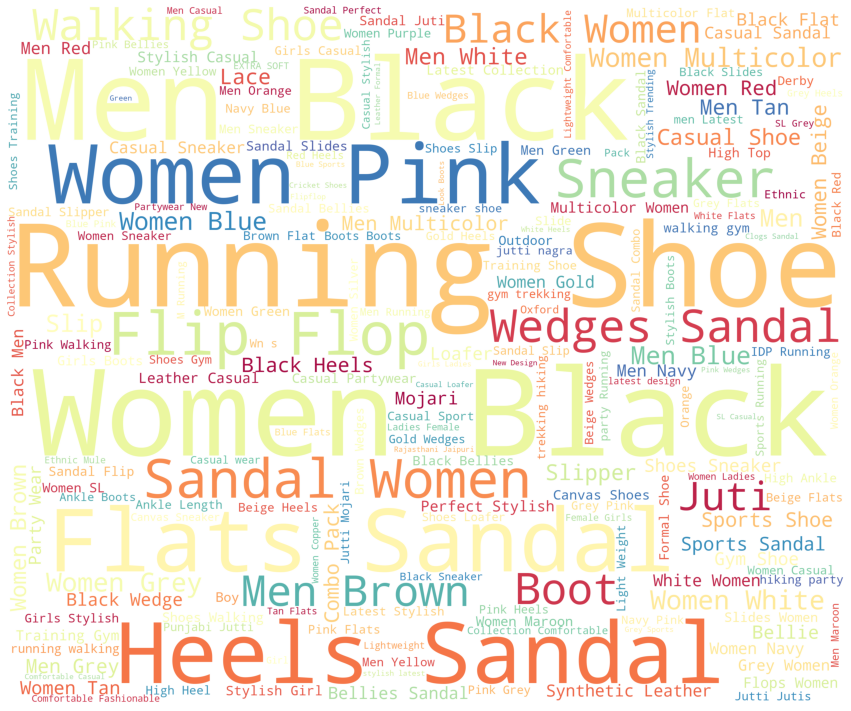

In [28]:
text = " ".join(titles for titles in ecom["title"])
word_cloud = WordCloud(background_color = 'white', width=3000, height=2500,
                       colormap = 'Spectral', min_font_size = 4).generate(text)
plt.figure(figsize = (15, 15))
plt.imshow(word_cloud)
plt.axis("off")
plt.show()

**The word that appear most in the dataset are written in the bigger font while the ones that appear less are written in relatively smaller font. A collage of these words is created.**

## Model Building
We will be training our data against following models:
1. AdaBoost Regressor
2. KNN Regressor
3. Random Forest Regressor
4. Decision Tree Regressor

### Encoding categorical variables to numerical values

In [29]:
ecom['maincateg'].value_counts()

Women     9056
Men       6613
Unisex      61
Name: maincateg, dtype: int64

In [30]:
maincateg_map = {'Women':1,'Men':2,'Unisex':3}

ecom['maincateg'] = ecom['maincateg'].map(maincateg_map)

In [31]:
ecom['platform'].value_counts()

Flipkart    15389
Amazon        341
Name: platform, dtype: int64

In [32]:
platform_map = {'Flipkart':1,'Amazon':2}

ecom['platform'] = ecom['platform'].map(platform_map)

### Train test split (70:30)

In [33]:
X = ecom.drop(['id','title','price1','Offer %'], axis = 1)
y = ecom.loc[:,'price1'].values

#print(X.columns)

# Applying Standard Scalar
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

X = pd.DataFrame(X,columns=['Rating', 'maincateg', 'platform', 'actprice1', 'norating1',
       'noreviews1', 'star_5f', 'star_4f', 'star_3f', 'star_2f', 'star_1f',
       'fulfilled1'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 101)

### Defining Score to calculate accuracy of various algorithms

In [34]:
def score(model, title = "Default"):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    
    # perform cross-validation
    cv_score = cross_val_score(model, X_train, y_train, cv=5)
    cv_score = np.abs(np.mean(cv_score))
    
    print("Model Report")
    print("CV Score:", cv_score)
    mae = mean_absolute_error(y_test,preds)
    rms = mean_squared_error(y_test,preds,squared = False)
    print(f'Mean Absolute Error: {mae}')
    print(f'Root mean squared error: {rms}')
          
    return mae

### Defining models

In [35]:
# AdaBoostRegressor
ab = AdaBoostRegressor(n_estimators=100,random_state=101)
ab_mae = score(ab,'Ada Boost')

Model Report
CV Score: 0.7323738284822987
Mean Absolute Error: 203.92163359604092
Root mean squared error: 306.4838518730327


In [36]:
# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100 , max_depth = 50, random_state=101)
rf_mae = score(rf,'Random Forest')

Model Report
CV Score: 0.8894970557209169
Mean Absolute Error: 99.52282666256995
Root mean squared error: 207.17728733594805


In [37]:
# KNN: KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors = 250, leaf_size = 10, weights='distance', algorithm = 'auto')
knn_mae = score(knn, "KNN")

Model Report
CV Score: 0.8655997160133511
Mean Absolute Error: 99.48644233899694
Root mean squared error: 242.37899261618284


In [38]:
# Decission trees: DecisionTreeRegressor with default parameters
Dtree = DecisionTreeRegressor(random_state=101)
dt_mae = score(Dtree, "Decission trees")

Model Report
CV Score: 0.8021982057105742
Mean Absolute Error: 107.7597780683445
Root mean squared error: 266.8719336982062


In [39]:
# Decission trees: DecisionTreeRegressor with max depth = 50
Dtree = DecisionTreeRegressor(criterion = 'squared_error', max_depth = 50, random_state=101)
dt_se_mae = score(Dtree, "Decission trees")

Model Report
CV Score: 0.8021982057105742
Mean Absolute Error: 107.7597780683445
Root mean squared error: 266.8719336982062


In [40]:
# Decission trees: DecisionTreeRegressor with criterion = absolute error & max depth = 50
Dtree = DecisionTreeRegressor(criterion = 'absolute_error', max_depth = 50, random_state=101)
dt_ae_mae = score(Dtree, "Decission trees")

Model Report
CV Score: 0.808906486780192
Mean Absolute Error: 104.58147912693367
Root mean squared error: 251.27277850585938


In [41]:
x = {'MAE':[rf_mae,knn_mae,dt_mae,dt_se_mae,dt_ae_mae,ab_mae]}
df = pd.DataFrame(x)
df['Algorithm']  = ['Random Forest', 'K-Nearest Neighbours','Decision Tree','Decision Tree with Squarred Error','Decision Tree with Absolute Error','AdaBoost']
df = df.sort_values('MAE', ascending = True)

fig = px.bar(df, y ='MAE', x ='Algorithm', color = 'Algorithm',
            color_discrete_sequence=px.colors.qualitative.Pastel,
            title = 'Mean Absolute Error from various models')
fig.update_layout(xaxis_title="MAE", yaxis_title="Algorithm")
fig.show()

**It can be inferred that, K-Nearest Neighbours Regressor performs best amongst other algorithms, closely followed by Random Forest Regressor and Decision Trees while, AdaBoost performs the least.**

## Inference and Conclusion
Based on the thorough analysis done, it can be concluded that:
1. About 60% of the products in the datasets are Flipkart assured/Amazon Fullfilled.
2. On an average, it has been observed that there are more products listed for women but 5 stars and reviews given are comparatively quite low as compared to men on any e-commerce platform.
3. There are better offers on Flipkart as compared to Amazon but it has to be noted that there are significantly less data points for Amazon.
4. K-Nearest Neighbours Regressor performs best amongst other algorithms, closely followed by Random Forest Regressor and Decision Trees while, AdaBoost performs the least.

## References and future work
All the useful links are listed below:
1. https://www.kaggle.com/competitions/sa2022/data
2. https://www.ibef.org/industry/ecommerce
3. https://plotly.com/
4. https://scikit-learn.org/stable/